# Warning : 
# To keep your modifications in case you want to come back later to this colab, do *File -> Save a copy in Drive*.

Before starting the TP, make sure that you are on a GPU environment:

Exécution -> Modifier le type d'exécution -> Accélerateur matériel = GPU

In [ ]:
import argparse
import os
import time

import PIL
from PIL import Image

import numpy as np
import torchvision
import pickle

import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.utils.data
import torchvision.datasets as datasets
import torchvision.models as models
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import torchvision.transforms.functional as F1
import torch.nn.functional as F2 
#134 million de params VGG16
from sklearn import svm


In [ ]:
!wget https://github.com/cdancette/deep-learning-polytech-tp6-7/raw/master/tp8/imagenet_classes.pkl

# Bonus : Classifier some examples with VGG16 and comment on the results in your report.
!wget --content-disposition https://unsplash.com/photos/gKXKBY-C-Dk/download?force=true -O cat.jpg
!wget --content-disposition https://unsplash.com/photos/qO-PIF84Vxg/download?force=true -O dog.jpg

--2021-12-12 11:27:37--  https://github.com/cdancette/deep-learning-polytech-tp6-7/raw/master/tp8/imagenet_classes.pkl
Resolving github.com (github.com)... 140.82.121.3
Connecting to github.com (github.com)|140.82.121.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/cdancette/deep-learning-polytech-tp6-7/master/tp8/imagenet_classes.pkl [following]
--2021-12-12 11:27:37--  https://raw.githubusercontent.com/cdancette/deep-learning-polytech-tp6-7/master/tp8/imagenet_classes.pkl
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.110.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 35454 (35K) [text/plain]
Saving to: ‘imagenet_classes.pkl.2’

imagenet_classes.pk 100%[===================>]  34.62K  --.-KB/s    in 0s      

2021-12-12 11:27:37 (107 MB/s) 

In [ ]:
import torchvision
from torchsummary import summary
vgg16 = torchvision.models.vgg16(pretrained=True)
if torch.cuda.is_available():
    vgg16.cuda()

# Part 1 : VGG16 Architecture

In [ ]:
summary(vgg16,  input_size=(3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
              ReLU-2         [-1, 64, 224, 224]               0
            Conv2d-3         [-1, 64, 224, 224]          36,928
              ReLU-4         [-1, 64, 224, 224]               0
         MaxPool2d-5         [-1, 64, 112, 112]               0
            Conv2d-6        [-1, 128, 112, 112]          73,856
              ReLU-7        [-1, 128, 112, 112]               0
            Conv2d-8        [-1, 128, 112, 112]         147,584
              ReLU-9        [-1, 128, 112, 112]               0
        MaxPool2d-10          [-1, 128, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]         295,168
             ReLU-12          [-1, 256, 56, 56]               0
           Conv2d-13          [-1, 256, 56, 56]         590,080
             ReLU-14          [-1, 256,

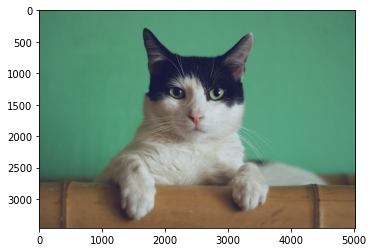

In [ ]:
cat = Image.open('cat.jpg')
#dog = Image.open('dog.jpg')
plt.imshow(cat)
#plt.imshow(dog)
# Add your images
# YOUR CODE HERE for the bonus:

vgg16 = torchvision.models.vgg16(pretrained=True)

imagenet_classes = pickle.load(open('imagenet_classes.pkl', 'rb')) # chargement des classes
img = Image.open("cat.jpg")
img = img.resize((224, 224), Image.BILINEAR)
img = np.array(img, dtype=np.float32) / 255
img = img.transpose((2, 0, 1))

In [ ]:
img_ = torch.tensor(np.expand_dims(img, 0))
print(img_.size())
x = F1.normalize(torch.tensor(img_), mean = [0.485, 0.456, 0.406], std = [0.229, 0.224, 0.225])
print(x.size())

torch.Size([1, 3, 224, 224])
torch.Size([1, 3, 224, 224])


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  This is separate from the ipykernel package so we can avoid doing imports until


In [ ]:
y =  vgg16(x)# TODO forward pass
y = y.detach().numpy().reshape(-1)# transformation to array numpy
print(y.shape)

(1000,)


In [ ]:
imagenet_classes[np.argmax(y)]

'Egyptian cat'

In [ ]:
no_of_layers=0
conv_layers=[]
 
model_children=list(vgg16.children())
 
for child in model_children:
  if type(child)==nn.Conv2d:
    no_of_layers+=1
    conv_layers.append(child)
  elif type(child)==nn.Sequential:
    for layer in child.children():
      if type(layer)==nn.Conv2d:
        no_of_layers+=1
        conv_layers.append(layer)
print(no_of_layers)

13


In [ ]:
results = [conv_layers[0](x)]
for i in range(1, len(conv_layers)):
    results.append(conv_layers[i](results[-1]))
outputs = results

Layer  1


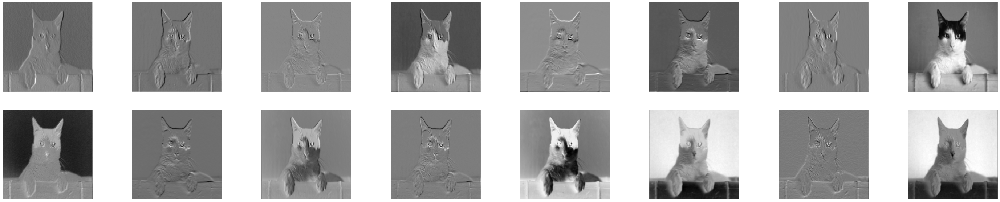

Layer  2


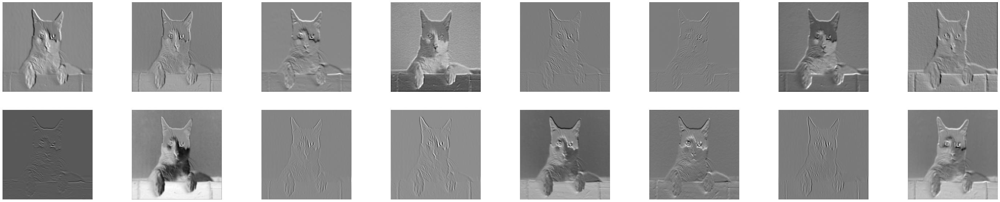

Layer  3


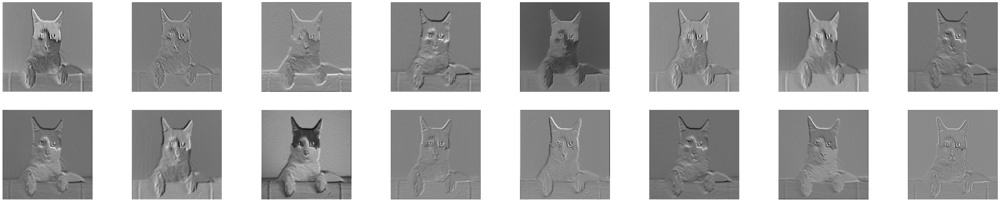

Layer  4


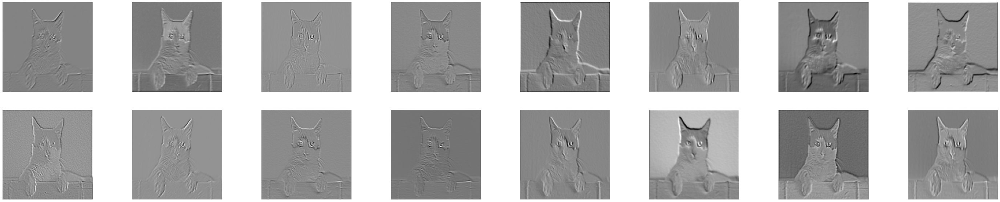

Layer  5


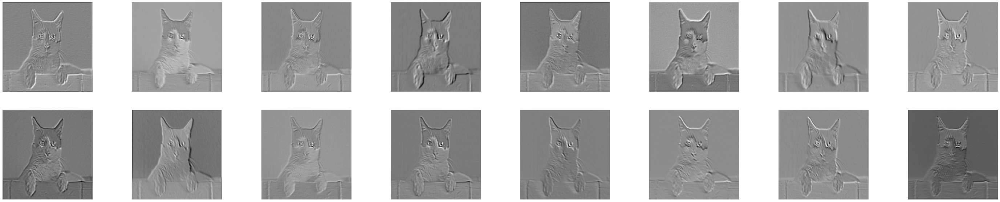

Layer  6


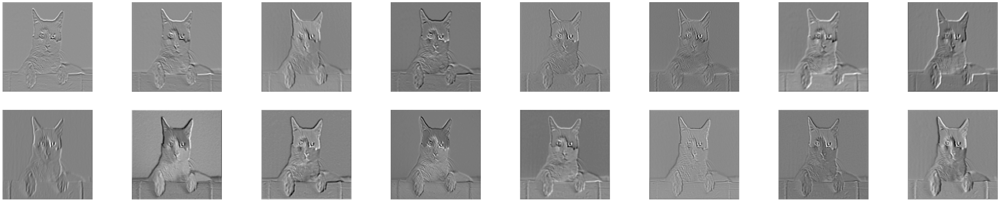

Layer  7


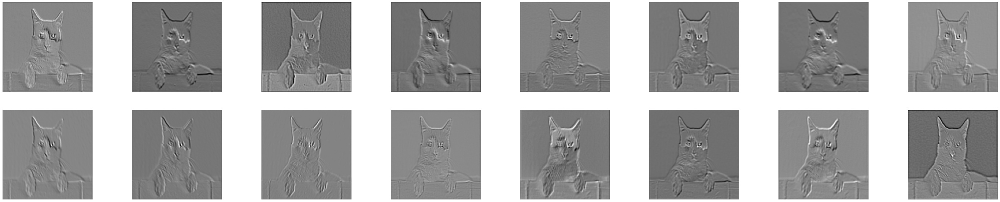

Layer  8


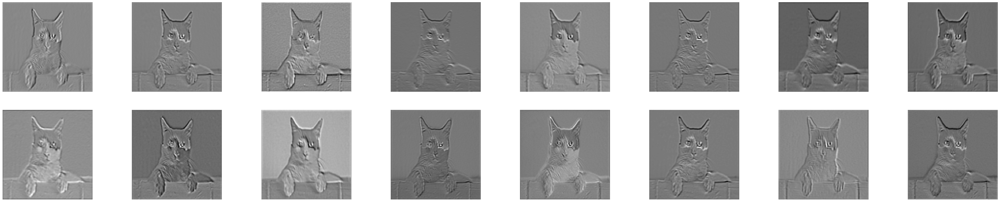

Layer  9


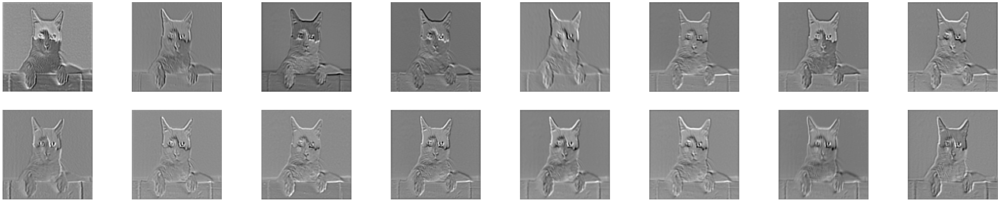

Layer  10


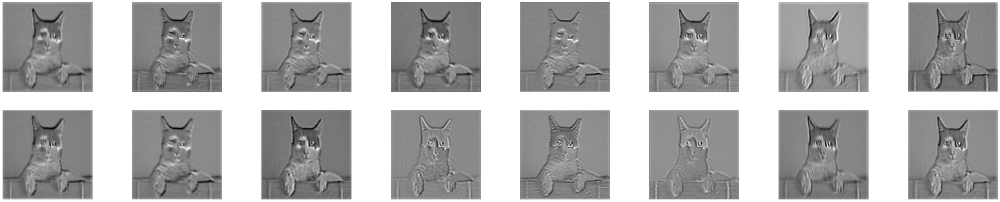

Layer  11


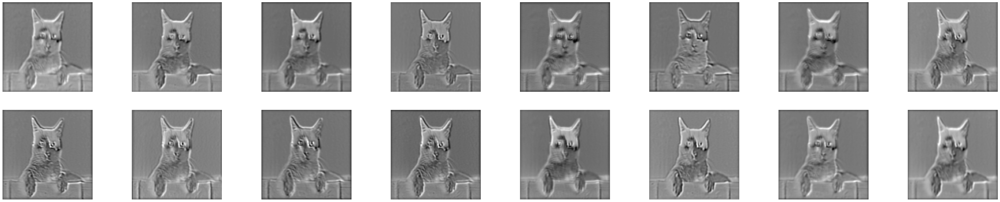

Layer  12


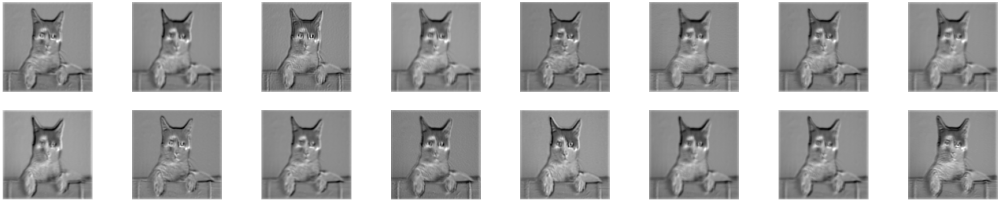

Layer  13


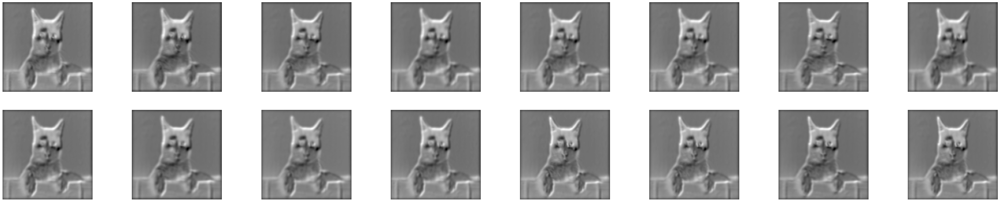

In [ ]:
for num_layer in range(len(outputs)):
    plt.figure(figsize=(50, 10))
    layer_viz = outputs[num_layer][0, :, :, :]
    layer_viz = layer_viz.data
    print("Layer ",num_layer+1)
    for i, filter in enumerate(layer_viz):
        if i == 16: 
            break
        plt.subplot(2, 8, i + 1)
        plt.imshow(filter, cmap='gray')
        plt.axis("off")
    plt.show()
    plt.close()

# Part 2: Transfer Learning with VGG16 on 15 Scene

In [ ]:
!wget https://github.com/cdancette/deep-learning-polytech-tp6-7/raw/master/tp8/15ScenesData.zip
!unzip 15ScenesData.zip


--2021-12-12 10:25:55--  https://github.com/cdancette/deep-learning-polytech-tp6-7/raw/master/tp8/15ScenesData.zip
Resolving github.com (github.com)... 140.82.121.4
Connecting to github.com (github.com)|140.82.121.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/cdancette/deep-learning-polytech-tp6-7/master/tp8/15ScenesData.zip [following]
--2021-12-12 10:25:55--  https://raw.githubusercontent.com/cdancette/deep-learning-polytech-tp6-7/master/tp8/15ScenesData.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.108.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 86520868 (83M) [application/zip]
Saving to: ‘15ScenesData.zip.1’

15ScenesData.zip.1  100%[===================>]  82.51M   169MB/s    in 0.5s    

2021-12-12 10:25:56 (169 MB/s) - ‘15Sce

In [ ]:
ls 15SceneData/test/bedroom/

image_0003.jpg  image_0042.jpg  image_0082.jpg  image_0124.jpg  image_0170.jpg
image_0004.jpg  image_0043.jpg  image_0084.jpg  image_0128.jpg  image_0175.jpg
image_0006.jpg  image_0047.jpg  image_0086.jpg  image_0130.jpg  image_0176.jpg
image_0007.jpg  image_0049.jpg  image_0087.jpg  image_0131.jpg  image_0180.jpg
image_0008.jpg  image_0050.jpg  image_0088.jpg  image_0134.jpg  image_0182.jpg
image_0011.jpg  image_0052.jpg  image_0090.jpg  image_0135.jpg  image_0189.jpg
image_0013.jpg  image_0053.jpg  image_0092.jpg  image_0138.jpg  image_0190.jpg
image_0014.jpg  image_0054.jpg  image_0093.jpg  image_0140.jpg  image_0191.jpg
image_0016.jpg  image_0056.jpg  image_0095.jpg  image_0141.jpg  image_0192.jpg
image_0017.jpg  image_0059.jpg  image_0096.jpg  image_0142.jpg  image_0195.jpg
image_0018.jpg  image_0060.jpg  image_0097.jpg  image_0144.jpg  image_0196.jpg
image_0019.jpg  image_0062.jpg  image_0098.jpg  image_0148.jpg  image_0200.jpg
image_0020.jpg  image_0063.jpg  image_0103.jpg  imag

In [ ]:
class VGG16relu7(nn.Module):
  def __init__(self, vgg16):
    super(VGG16relu7, self).__init__()
    # Copy the entire convolutional part
    self.features = nn.Sequential( *list(vgg16.features.children()))
    # Keep a piece of the classifier: -2 to stop at relu7
    self.classifier = nn.Sequential(*list(vgg16.classifier.children())[:-2])

  def forward(self, x):
    x = self.features(x)
    x = x.view(x.size(0), -1)
    x = self.classifier(x)
    return x

In [ ]:
PRINT_INTERVAL = 50
CUDA = True
def my_collate(batch):
    data = [item[0] for item in batch]
    target = [item[1] for item in batch]
    target = torch.LongTensor(target)
    return [data, target]

def get_dataset(batch_size, path):

    # This function allows us to copy an image 3 times and thus "transform" a 
    # black and white image with 1 channel into an RGB image with 3 channels.
    # Use it with transform.Lambda
    def duplicateChannel(img):
        img = img.convert('L')
        np_img = np.array(img, dtype=np.uint8)
        np_img = np.dstack([np_img, np_img, np_img])
        img = Image.fromarray(np_img, 'RGB')
        return img

    # Add pre-processing
    train_dataset = datasets.ImageFolder(path+'/train',
        transform=transforms.Compose([            
            transforms.Lambda(lambda x: duplicateChannel(x)),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
            transforms.Resize((224, 224))
        ]))
    val_dataset = datasets.ImageFolder(path+'/test',
        transform=transforms.Compose([                                                
            transforms.Lambda(lambda x: duplicateChannel(x)),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
            transforms.Resize((224, 224))
        ]))
    train_loader = torch.utils.data.DataLoader(train_dataset, 
                        batch_size=batch_size, shuffle=False, pin_memory=CUDA, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset, 
                        batch_size=batch_size, shuffle=False, pin_memory=CUDA, num_workers=2)
   
    return train_loader, val_loader

In [ ]:
def extract_features(data, model):
    X = []
    Y = []
    for i, (input, target) in enumerate(data):
        if i % PRINT_INTERVAL == 0:
            print('Batch {0:03d}/{1:03d}'.format(i, len(data)))
        if CUDA:
            input = input.cuda()

        out = model(input)
        del input
        X.append(out.detach().cpu())
        Y.append(target)
    res1, res2 = torch.vstack(X), torch.cat(Y)
    print(res1.size(), res2.size())
    return res1, res2


def main(path="15SceneData", batch_size=4):
    print('Initializing VGG16')
    vgg16 = models.vgg16(pretrained=True)
    
    print('Initializing VGG16relu7')
    # Replace with a truncated network to perform feature extraction
    # We will create a new class VGG16relu here.

    model = VGG16relu7(vgg16)
    clf = svm.SVC()
    ####################
    ##      END        #
    ####################      
    
    model.eval()
    if CUDA: # If we have GPU, use CUDA
        cudnn.benchmark = True
        model = model.cuda()

    # Obtain the data
    print('Obtaining data')
    train, test = get_dataset(batch_size, path)

    # Feature Extraction
    print('Feature extraction')
    X_train, y_train = extract_features(train, model)
    X_test, y_test = extract_features(test, model)

    print(X_train.size(), y_train.size())
    # Training and evaluation of SVMs here
    print('Training SVMs')
    accuracy = 0
    clf.fit(X_train, y_train) 
    accuracy = clf.score(X_test, y_test)
    print('Accuracy = %f' % accuracy)


In [ ]:
main("15SceneData", 8)

Initializing VGG16
Initializing VGG16relu7
Obtaining data
Feature extraction
Batch 000/188
Batch 050/188
Batch 100/188
Batch 150/188
torch.Size([1500, 4096]) torch.Size([1500])
Batch 000/374
Batch 050/374
Batch 100/374
Batch 150/374
Batch 200/374
Batch 250/374
Batch 300/374
Batch 350/374
torch.Size([2985, 4096]) torch.Size([2985])
torch.Size([1500, 4096]) torch.Size([1500])
Training SVMs
Accuracy = 0.895477
